In [1]:
# importing relvant libraries
import math
import matplotlib.pyplot as plt
plt.style.use(['science','ieee'])
plt.rcParams.update({'text.usetex': False})

from ComPhy import *

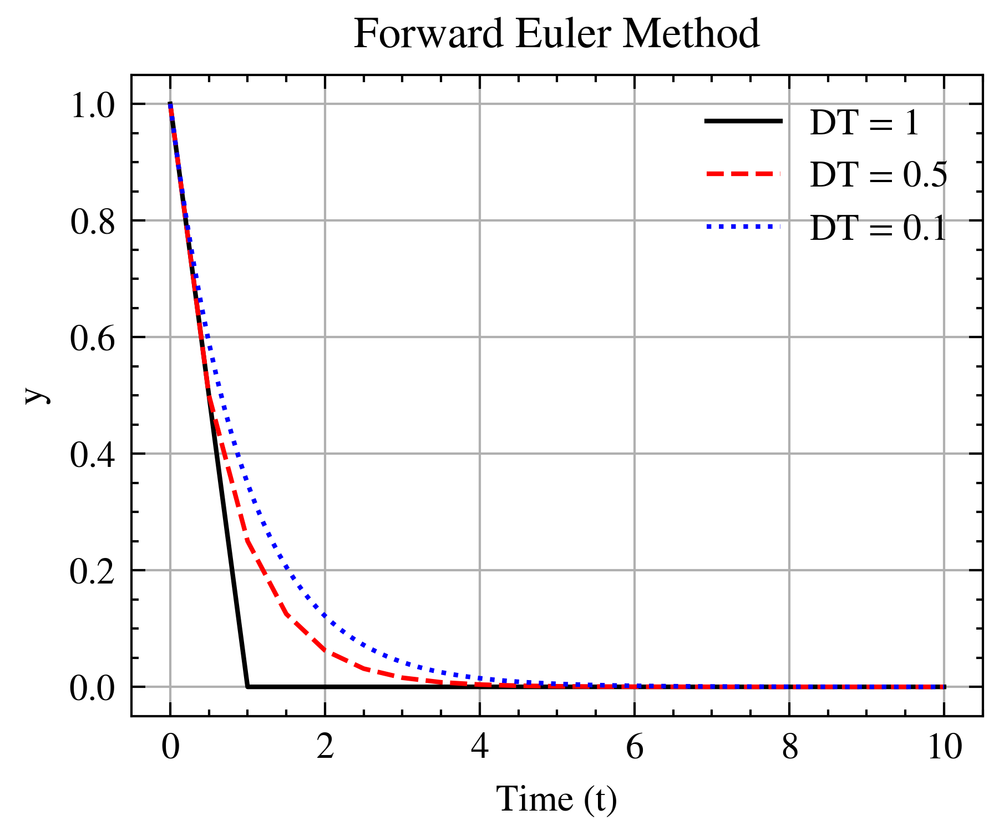

In [2]:
# Example usage
def f(t, y):
    return -y

total_time = 10
dt = [1, 0.5, 0.1]
plot_label = '-y'

y0 = 1

sol = forward_euler(f, y0, total_time, dt, plot_label=plot_label)

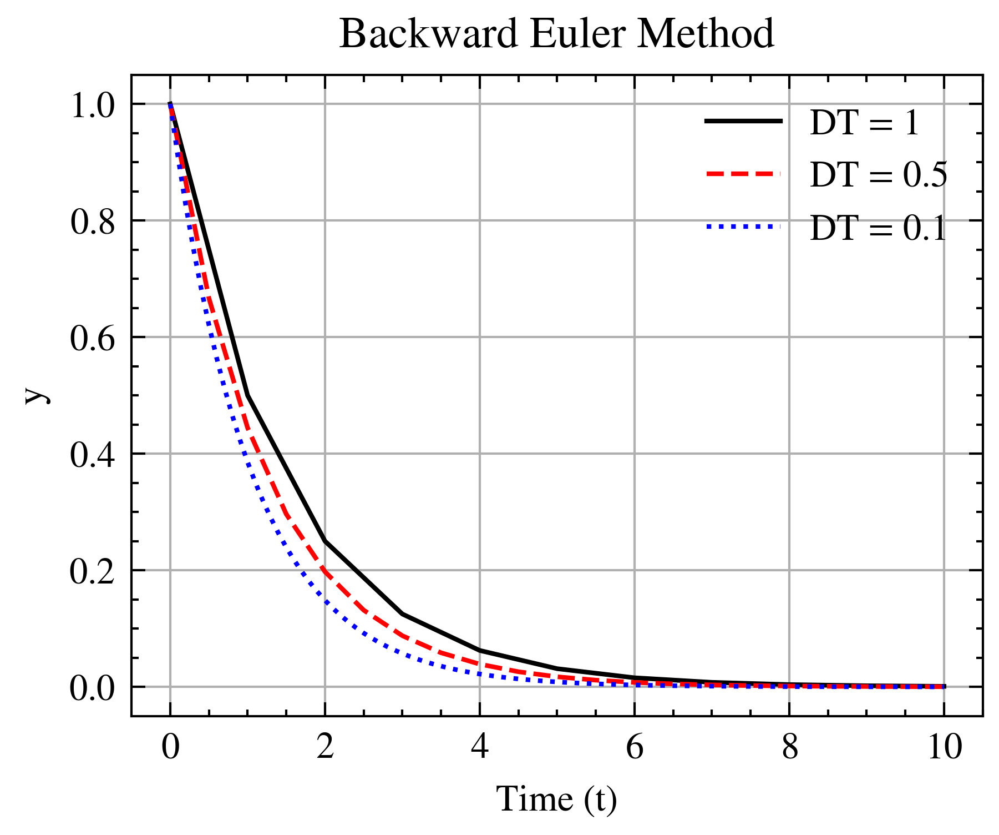

In [3]:
sol = backward_euler(f, y0, total_time, dt, plot_label=plot_label)

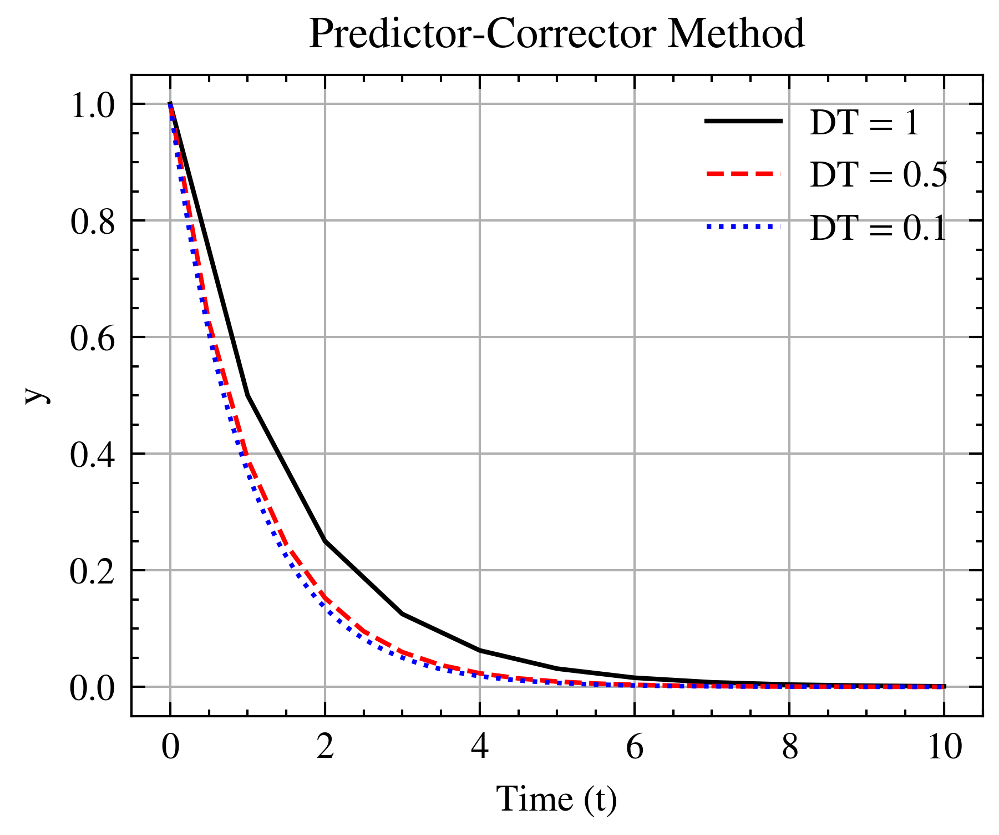

In [4]:
sol = predictor_corrector(f, y0, total_time, dt, plot_label=plot_label)

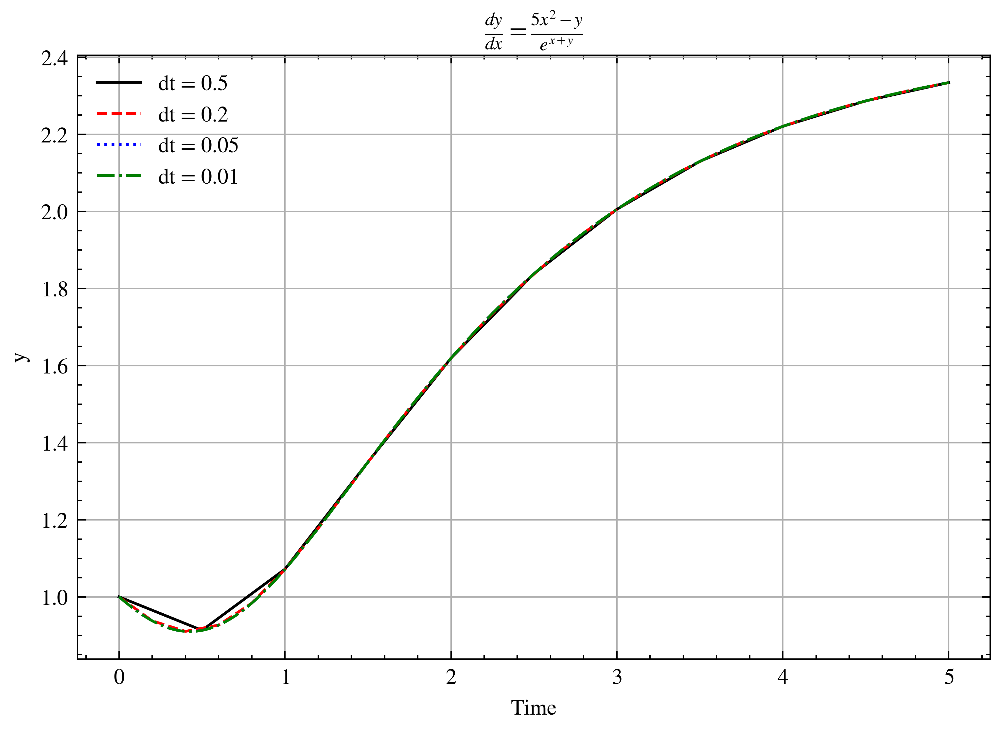

In [5]:
def f(t, y):
    return [(5 * t**2 - y[0]) / math.exp(t + y[0])]

# Initial conditions
y0 = [1]
total_time = 5
dt_values = [0.5, 0.2, 0.05, 0.01]

# Plots
plot_label = r"$\frac{dy}{dx} = \frac{5x^2 - y}{e^{x+y}}$"
solutions = runge_kutta_4(f, y0, total_time, dt_values, plot_label=plot_label)

In [6]:
def lorenz_equations(t, y):
    sigma = 10
    rho = 28
    beta = 8 / 3
    return [
        sigma * (y[1] - y[0]),
        y[0] * (rho - y[2]) - y[1],
        y[0] * y[1] - beta * y[2]
    ]


y0_lorenz = [0, 1, 1.05]
total_time_lorenz = 40
dt_values_lorenz = [0.01]

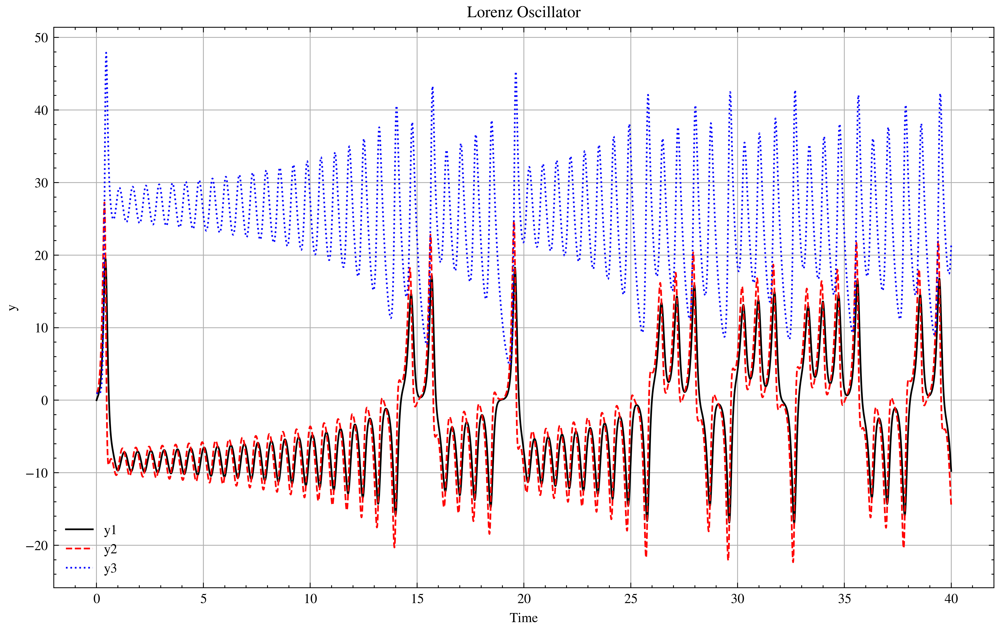

In [7]:
plot_label_lorenz = "Lorenz Oscillator"
solutions_lorenz = coupled_runge_kutta_4(lorenz_equations, y0_lorenz, total_time_lorenz, dt_values_lorenz, plot_label=plot_label_lorenz)

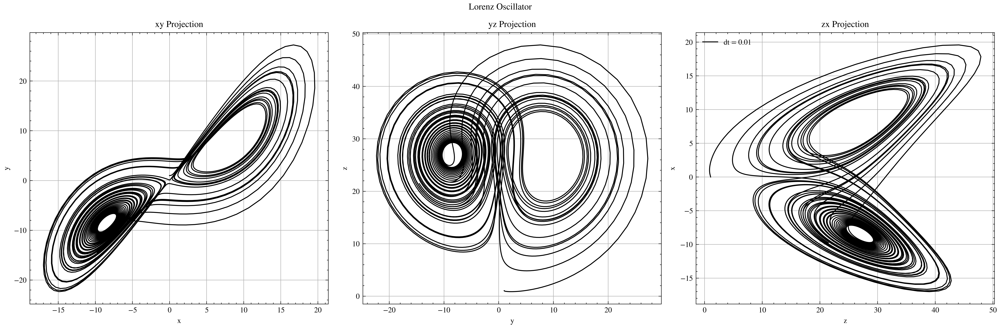

In [8]:
plot_projections(solutions_lorenz, plot_label=plot_label_lorenz)

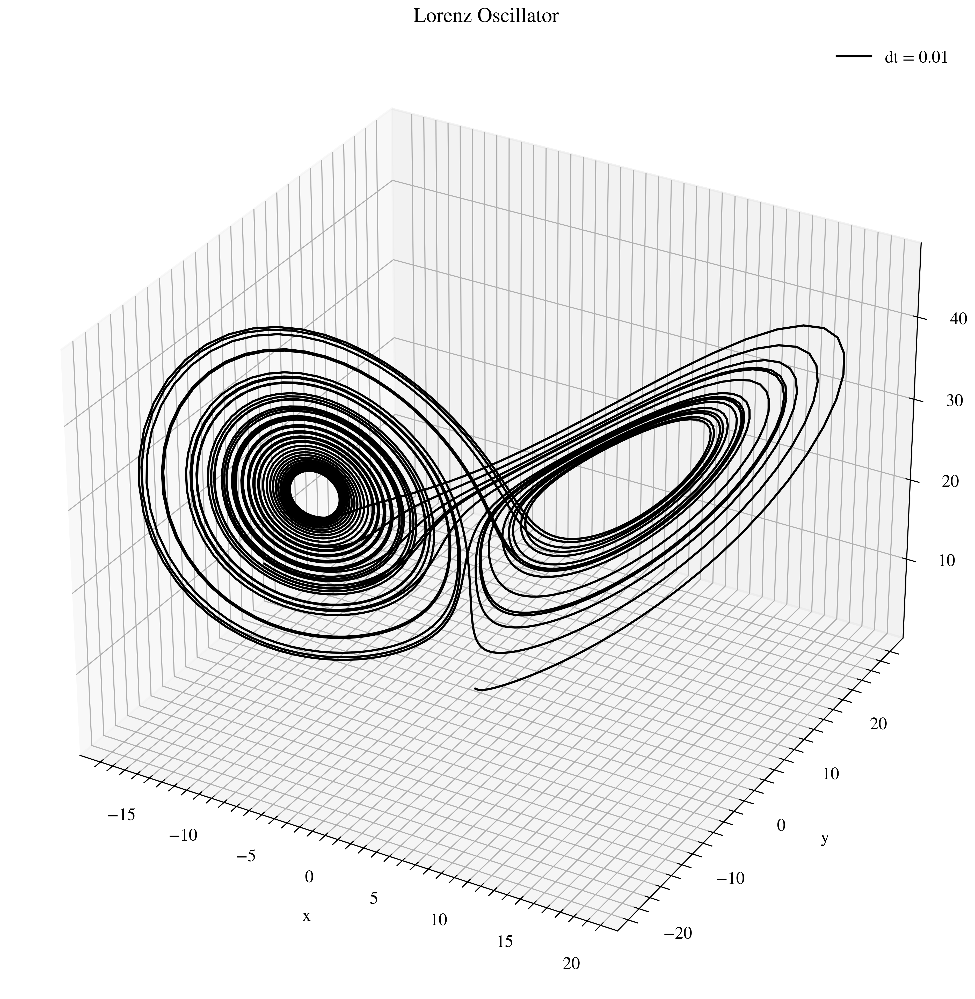

In [9]:
plot_3d(solutions_lorenz, plot_label=plot_label_lorenz)

In [10]:
# System parameters
omega1 = 1.0
omega2 = 1.5
alpha = 0.1

# Initial conditions [x1, v1, x2, v2]
y0 = [1.0, 0.0, -1.0, 0.0]

# Total time and time step
total_time = 10.0
dt = 0.01

def coupled_harmonic_oscillators(t, y, omega1=omega1, omega2=omega2, alpha=alpha):
    x1, v1, x2, v2 = y
    dx1_dt = v1
    dv1_dt = -omega1**2 * x1 - alpha * (x1 - x2)
    dx2_dt = v2
    dv2_dt = -omega2**2 * x2 - alpha * (x2 - x1)
    return [dx1_dt, dv1_dt, dx2_dt, dv2_dt]


In [11]:
# semi-implicit Euler method
t_semi_euler, y_semi_euler = semi_implicit_euler(coupled_harmonic_oscillators, y0, total_time, dt)

# Verlet method
t_verlet, y_verlet = verlet(coupled_harmonic_oscillators, y0, total_time, dt)

# Leapfrog method
t_leapfrog, y_leapfrog = leapfrog(coupled_harmonic_oscillators, y0, total_time, dt)

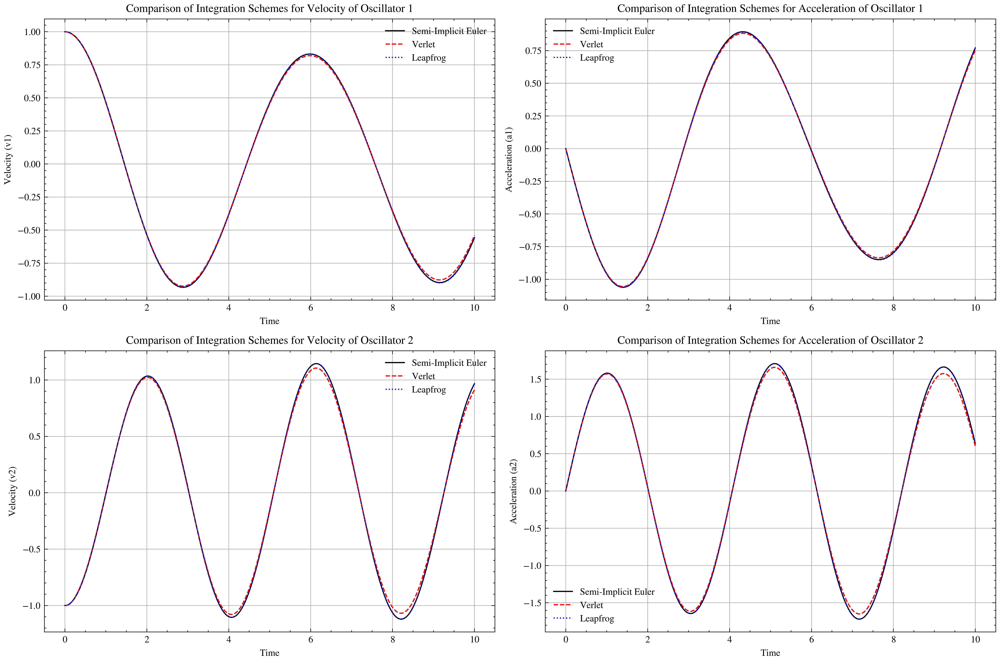

In [12]:
v1_semi_euler = [y[0] for y in y_semi_euler]
a1_semi_euler = [y[1] for y in y_semi_euler]
v2_semi_euler = [y[2] for y in y_semi_euler]
a2_semi_euler = [y[3] for y in y_semi_euler]

v1_verlet = [y[0] for y in y_verlet]
a1_verlet = [y[1] for y in y_verlet]
v2_verlet = [y[2] for y in y_verlet]
a2_verlet = [y[3] for y in y_verlet]

v1_leapfrog = [y[0] for y in y_leapfrog]
a1_leapfrog = [y[1] for y in y_leapfrog]
v2_leapfrog = [y[2] for y in y_leapfrog]
a2_leapfrog = [y[3] for y in y_leapfrog]

# Plotting
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(t_semi_euler, v1_semi_euler, label="Semi-Implicit Euler")
plt.plot(t_verlet, v1_verlet, label="Verlet")
plt.plot(t_leapfrog, v1_leapfrog, label="Leapfrog")
plt.xlabel("Time")
plt.ylabel("Velocity (v1)")
plt.title("Comparison of Integration Schemes for Velocity of Oscillator 1")
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 2)
plt.plot(t_semi_euler, a1_semi_euler, label="Semi-Implicit Euler")
plt.plot(t_verlet, a1_verlet, label="Verlet")
plt.plot(t_leapfrog, a1_leapfrog, label="Leapfrog")
plt.xlabel("Time")
plt.ylabel("Acceleration (a1)")
plt.title("Comparison of Integration Schemes for Acceleration of Oscillator 1")
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 3)
plt.plot(t_semi_euler, v2_semi_euler, label="Semi-Implicit Euler")
plt.plot(t_verlet, v2_verlet, label="Verlet")
plt.plot(t_leapfrog, v2_leapfrog, label="Leapfrog")
plt.xlabel("Time")
plt.ylabel("Velocity (v2)")
plt.title("Comparison of Integration Schemes for Velocity of Oscillator 2")
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 4)
plt.plot(t_semi_euler, a2_semi_euler, label="Semi-Implicit Euler")
plt.plot(t_verlet, a2_verlet, label="Verlet")
plt.plot(t_leapfrog, a2_leapfrog, label="Leapfrog")
plt.xlabel("Time")
plt.ylabel("Acceleration (a2)")
plt.title("Comparison of Integration Schemes for Acceleration of Oscillator 2")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

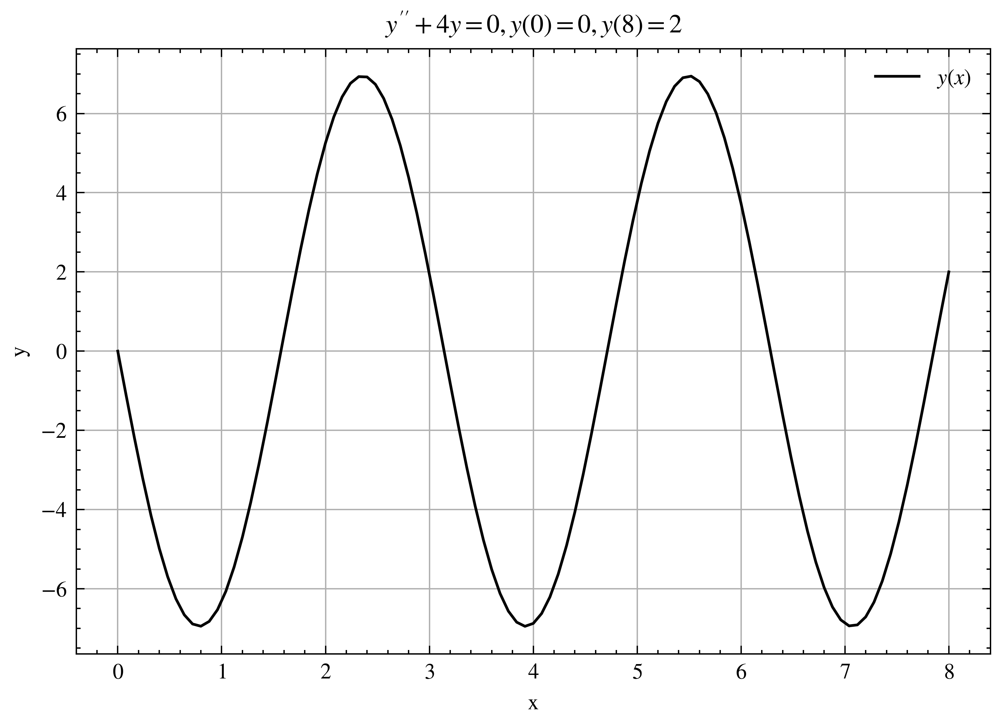

In [13]:
# system of first-order differential equations
def system_of_odes(x, y, z):
    dy_dx = z
    dz_dx = -4 * y
    return np.array([dy_dx, dz_dx])

#  boundary conditions
alpha = 0  # y(a) or y'(a) depending on the boundary type
beta = 2   # y(b) or y'(b) depending on the boundary type

# Define the boundary value problem
a = 0
b = 8
N = 100

boundary_type = 'Dirichlet'  
plot_label = '$y\'\' + 4y = 0, y(0) = 0, y(8) = 2$'

# boundary value problem using the shooting method
x, y = shooting_method_bvp(system_of_odes, a, b, alpha, beta, N, boundary_type, plot_label, plot=True)